In [1]:
# Загружаем необходимые библиотеки.
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib as mpl
import tensorflow as tf
import tensorflow.compat.v1 as tf
tf.disable_v2_behavior() 
from sklearn import preprocessing
from sklearn.neighbors import KNeighborsRegressor
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import r2_score
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV

Instructions for updating:
non-resource variables are not supported in the long term


In [2]:
def import_data():
    # Загружаем обьединенный датасет.
    # data = pd.read_excel("C:/Users/User/VKR/all.xlsx")
    df_bp = []
    df_bp = pd.read_csv('C:/Users/User/VKR/X_bp.csv')
    df_nup = []
    df_nup = pd.read_csv('C:/Users/User/VKR/X_nup.csv')
    df = df_bp.merge(df_nup, left_on='Unnamed: 0', right_on='Unnamed: 0')
    return df

In [3]:
data = import_data()
data

,Unnamed: 0,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,0,1.857143,2030.000000,738.736842,30.000000,22.267857,100.000000,210.000000,70.000000,3000.000000,220.000000,0,4.000000,57.000000
1,1,1.857143,2030.000000,738.736842,50.000000,23.750000,284.615385,210.000000,70.000000,3000.000000,220.000000,0,4.000000,60.000000
2,2,1.857143,2030.000000,738.736842,49.900000,33.000000,284.615385,210.000000,70.000000,3000.000000,220.000000,0,4.000000,70.000000
3,3,1.857143,2030.000000,738.736842,129.000000,21.250000,300.000000,210.000000,70.000000,3000.000000,220.000000,0,5.000000,47.000000
4,4,2.771331,2030.000000,753.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000,0,5.000000,57.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1018,1018,2.271346,1952.087902,912.855545,86.992183,20.123249,324.774576,209.198700,73.090961,2387.292495,125.007669,90,9.076380,47.019770
1019,1019,3.444022,2050.089171,444.732634,145.981978,19.599769,254.215401,350.660830,72.920827,2360.392784,117.730099,90,10.565614,53.750790
1020,1020,3.280604,1972.372865,416.836524,110.533477,23.957502,248.423047,740.142791,74.734344,2662.906040,236.606764,90,4.161154,67.629684
1021,1021,3.705351,2066.799773,741.475517,141.397963,19.246945,275.779840,641.468152,74.042708,2071.715856,197.126067,90,6.313201,58.261074


In [4]:
# Вычисляем коэффициенты ранговой корреляции Кендалла. Статистической зависимости не наблюдаем.
data.corr(method ='kendall')

,Unnamed: 0,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
Unnamed: 0,1.000000,-0.005431,-0.029879,-0.032924,0.000752,0.000725,0.002238,0.019090,0.022863,0.020789,0.012673,0.653268,0.016090,0.046928
Соотношение матрица-наполнитель,-0.005431,1.000000,-0.003135,0.021247,0.001410,0.010180,-0.009480,-0.002060,-0.004157,0.011614,0.035145,-0.021395,0.022723,0.002788
"Плотность, кг/м3",-0.029879,-0.003135,1.000000,-0.008059,-0.021963,-0.007758,-0.019947,0.037302,-0.021151,-0.047426,-0.017079,-0.051525,-0.031220,0.052935
"модуль упругости, ГПа",-0.032924,0.021247,-0.008059,1.000000,0.022382,0.002351,0.021028,-0.000442,0.005458,0.022959,0.005169,-0.031695,-0.008305,0.049347
"Количество отвердителя, м.%",0.000752,0.001410,-0.021963,0.022382,1.000000,0.000010,0.059034,0.033110,-0.043140,-0.046507,-0.003677,0.024690,0.006232,0.016607
"Содержание эпоксидных групп,%_2",0.000725,0.010180,-0.007758,0.002351,0.000010,1.000000,-0.002170,-0.006859,0.041994,-0.013441,0.009756,0.004668,-0.004539,-0.021968
"Температура вспышки, С_2",0.002238,-0.009480,-0.019947,0.021028,0.059034,-0.002170,1.000000,0.017196,0.016481,-0.019106,0.035313,0.017880,0.029552,0.005268
"Поверхностная плотность, г/м2",0.019090,-0.002060,0.037302,-0.000442,0.033110,-0.006859,0.017196,1.000000,0.024051,-0.005099,-0.004446,0.045452,0.025514,-0.022320
"Модуль упругости при растяжении, ГПа",0.022863,-0.004157,-0.021151,0.005458,-0.043140,0.041994,0.016481,0.024051,1.000000,-0.006599,0.034814,0.022431,-0.010024,-0.002600
"Прочность при растяжении, МПа",0.020789,0.011614,-0.047426,0.022959,-0.046507,-0.013441,-0.019106,-0.005099,-0.006599,1.000000,0.013580,0.020609,-0.048049,0.009821


In [5]:
#Вычисляем коэффициенты корреляции Пирсона. Статистической зависимости не наблюдаем.
data.corr(method ='pearson')

,Unnamed: 0,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
Unnamed: 0,1.000000,-0.018560,-0.054704,-0.048318,0.020763,0.004583,0.011248,0.026010,0.030769,0.036775,0.006488,0.799695,0.024507,0.079529
Соотношение матрица-наполнитель,-0.018560,1.000000,0.003841,0.031700,-0.006445,0.019766,-0.004776,-0.006272,-0.008411,0.024148,0.072531,-0.031073,0.036437,-0.004652
"Плотность, кг/м3",-0.054704,0.003841,1.000000,-0.009647,-0.035911,-0.008278,-0.020695,0.044930,-0.017602,-0.069981,-0.015937,-0.068474,-0.061015,0.080304
"модуль упругости, ГПа",-0.048318,0.031700,-0.009647,1.000000,0.024049,-0.006804,0.031174,-0.005306,0.023267,0.041868,0.001840,-0.025417,-0.009875,0.056346
"Количество отвердителя, м.%",0.020763,-0.006445,-0.035911,0.024049,1.000000,-0.000684,0.095193,0.055198,-0.065929,-0.075375,0.007446,0.038570,0.014887,0.017248
"Содержание эпоксидных групп,%_2",0.004583,0.019766,-0.008278,-0.006804,-0.000684,1.000000,-0.009769,-0.012940,0.056828,-0.023899,0.015165,0.008052,0.003022,-0.039073
"Температура вспышки, С_2",0.011248,-0.004776,-0.020695,0.031174,0.095193,-0.009769,1.000000,0.020121,0.028414,-0.031763,0.059954,0.020695,0.025795,0.011391
"Поверхностная плотность, г/м2",0.026010,-0.006272,0.044930,-0.005306,0.055198,-0.012940,0.020121,1.000000,0.036702,-0.003210,0.015692,0.052299,0.038332,-0.049923
"Модуль упругости при растяжении, ГПа",0.030769,-0.008411,-0.017602,0.023267,-0.065929,0.056828,0.028414,0.036702,1.000000,-0.009009,0.050938,0.023003,-0.029468,0.006476
"Прочность при растяжении, МПа",0.036775,0.024148,-0.069981,0.041868,-0.075375,-0.023899,-0.031763,-0.003210,-0.009009,1.000000,0.028602,0.023398,-0.059547,0.019604


In [7]:
# Присваиваем названия столбцам датасета
colnames = ["Соотношение матрица-наполнитель","Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%",
         "Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2",
         "Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2",
          "Угол нашивки, град","Шаг нашивки","Плотность нашивки"]

Соотношение матрица-наполнитель


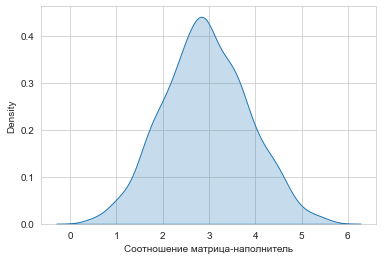

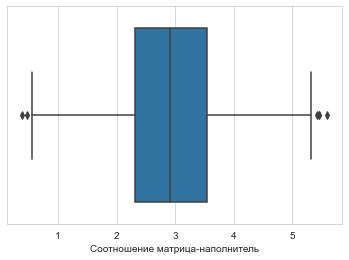

Минимальное значение:  0.38940260517841
Максимальное значение:  5.5917415986975
Среднее значение:  2.9303657734325483
Медианное значение:  2.9068776503352



Плотность, кг/м3


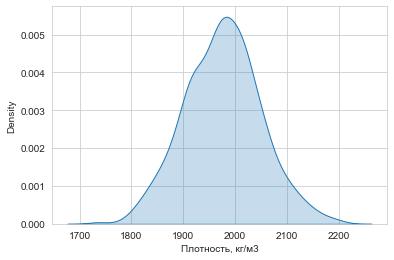

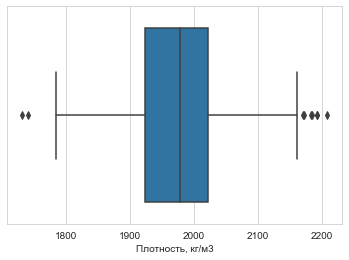

Минимальное значение:  1731.764635096
Максимальное значение:  2207.7734806112
Среднее значение:  1975.7348881101573
Медианное значение:  1977.6216567906



модуль упругости, ГПа


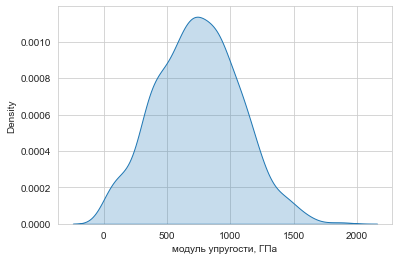

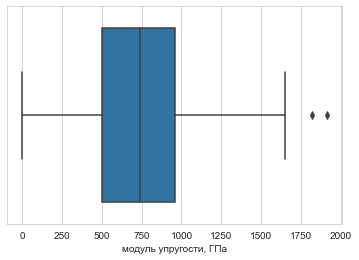

Минимальное значение:  2.4369087535075
Максимальное значение:  1911.5364770005
Среднее значение:  739.9232327560719
Медианное значение:  739.66432769779



Количество отвердителя, м.%


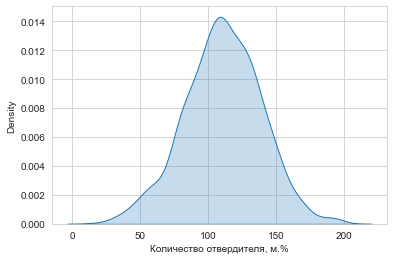

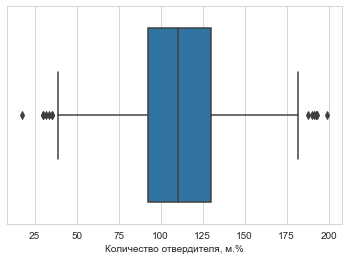

Минимальное значение:  17.740274556252
Максимальное значение:  198.95320719045
Среднее значение:  110.57076864736254
Медианное значение:  110.56483989407



Содержание эпоксидных групп,%_2


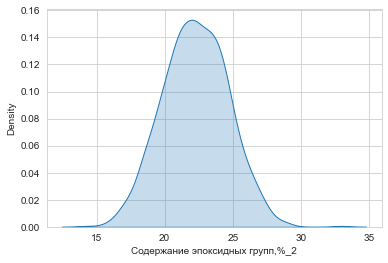

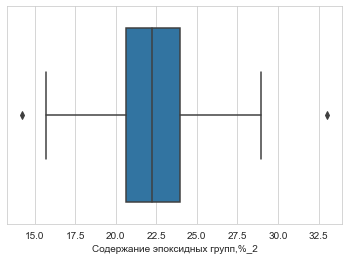

Минимальное значение:  14.254985497716
Максимальное значение:  33.0
Среднее значение:  22.244389547767728
Медианное значение:  22.230743756024



Температура вспышки, С_2


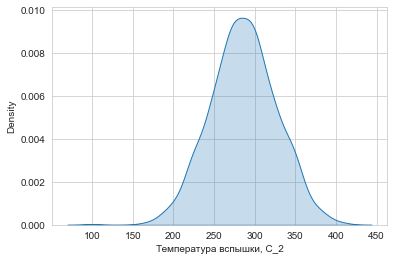

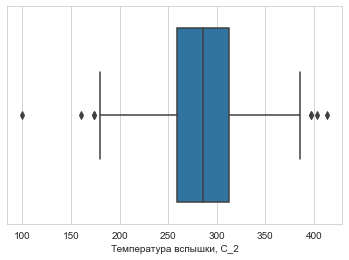

Минимальное значение:  100.0
Максимальное значение:  413.27341824357
Среднее значение:  285.8821513516217
Медианное значение:  285.89681233124



Поверхностная плотность, г/м2


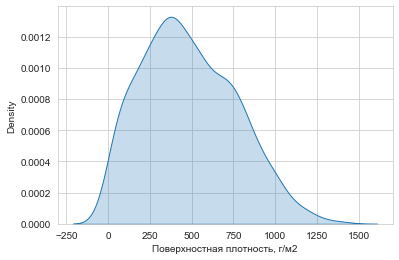

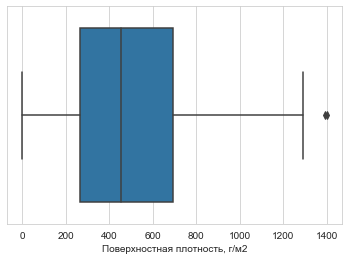

Минимальное значение:  0.60373992515395
Максимальное значение:  1399.5423623399
Среднее значение:  482.73183303841853
Медианное значение:  451.86436518306



Модуль упругости при растяжении, ГПа


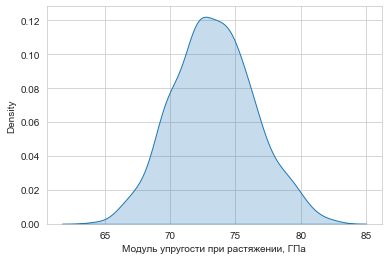

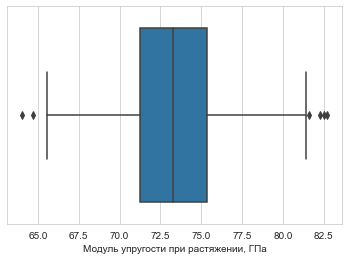

Минимальное значение:  64.054060559792
Максимальное значение:  82.682051035271
Среднее значение:  73.32857125009068
Медианное значение:  73.268804594348



Прочность при растяжении, МПа


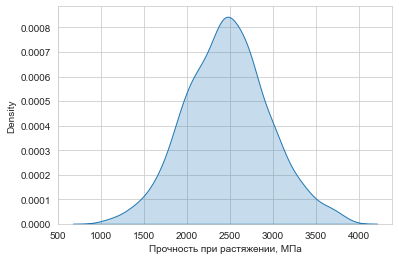

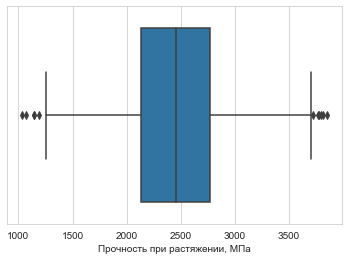

Минимальное значение:  1036.85660535
Максимальное значение:  3848.4367318762
Среднее значение:  2466.922842697903
Медианное значение:  2459.5245260031



Потребление смолы, г/м2


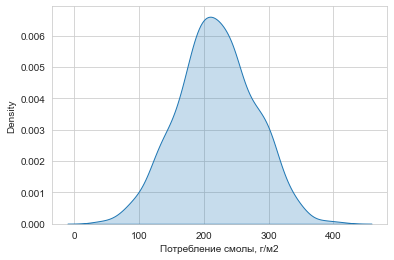

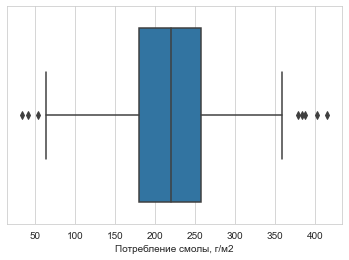

Минимальное значение:  33.803025532963
Максимальное значение:  414.59062836153
Среднее значение:  218.42314367654285
Медианное значение:  219.19888219513



Угол нашивки, град


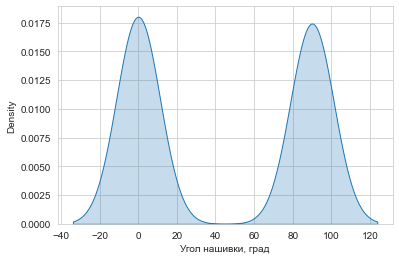

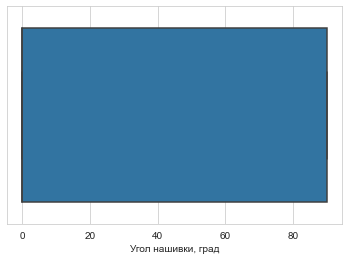

Минимальное значение:  0
Максимальное значение:  90
Среднее значение:  44.252199413489734
Медианное значение:  0.0



Шаг нашивки


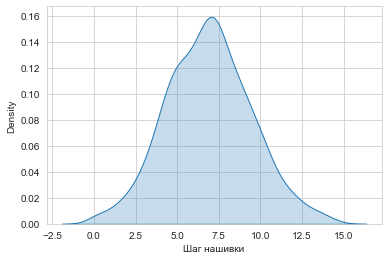

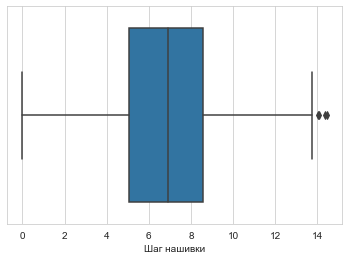

Минимальное значение:  0.0
Максимальное значение:  14.440521875397
Среднее значение:  6.899222077675016
Медианное значение:  6.9161438559491



Плотность нашивки


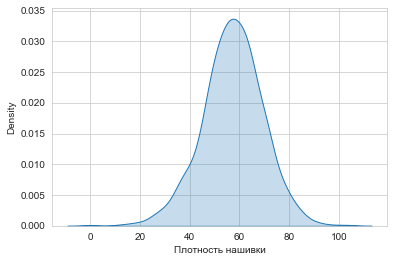

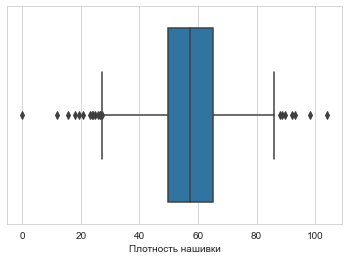

Минимальное значение:  0.0
Максимальное значение:  103.98890130149
Среднее значение:  57.15392943285764
Медианное значение:  57.341919846993





In [8]:
# Проводим разведочный анализ датасета. 
for colname in colnames:
    print(colname)
# Рисуем гистограммы распределения каждой из переменной.
    sub_data = data[colname]
    sns.set_style("whitegrid")
    sns.kdeplot(data=sub_data,shade=True, palette='colorblind')
    plt.show()
# Рисуем диаграммы ящика с усами
    sns.boxplot(x=sub_data);
    plt.show()
# Для каждой колонки (признака) указываем минимальное, максимальное, среднее и медианное значение.
    print("Минимальное значение: ", end=" ")
    print(np.min(sub_data))
    print("Максимальное значение: ", end=" ")
    print(np.max(sub_data))
    print("Среднее значение: ",   end=" ")
    print(np.mean(sub_data))
    print("Медианное значение: ", end=" ")
    print(np.median(sub_data))
    print("\n\n") 

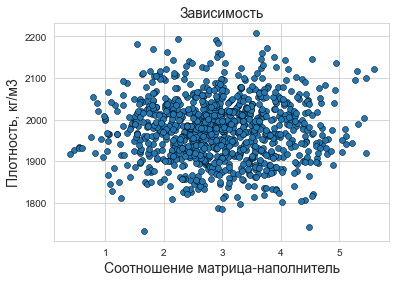

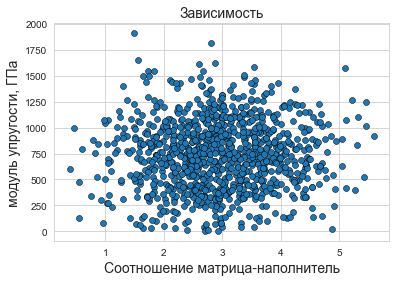

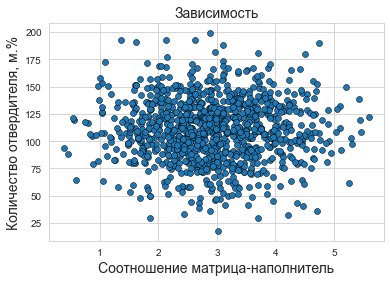

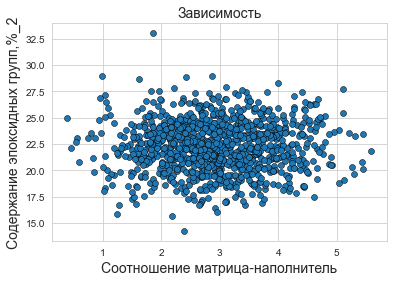

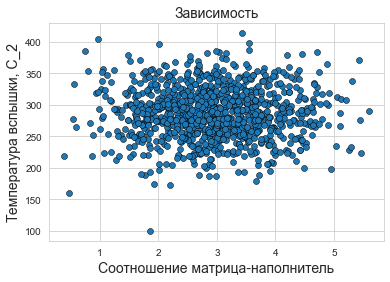

...

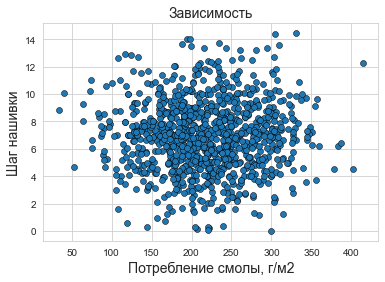

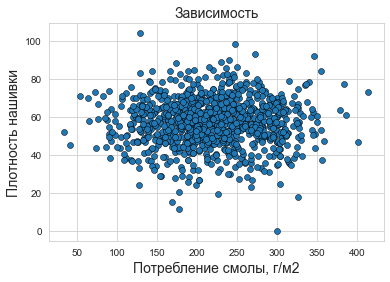

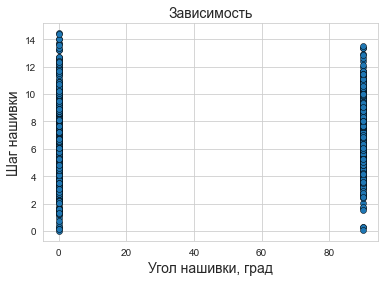

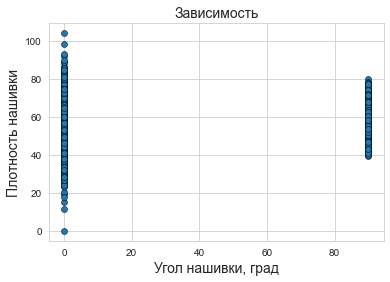

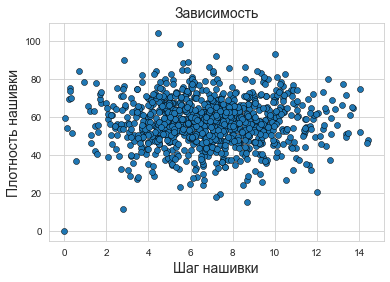

In [9]:
# Рисуем попарные графики рассеянивания точек.
number = 0
while number < len(colnames):
    number2 = number+1
    while number2 < len(colnames):
        sns.set_style('whitegrid')
        plt.title('Зависимость',size=14)
        plt.xlabel(colnames[number],size=14)
        plt.ylabel(colnames[number2],size=14)
        sns.scatterplot(x=colnames[number], y=colnames[number2], data=data, edgecolor='black', palette='cubehelix')
        plt.show()
        number2 += 1
    number += 1

In [10]:
#Проверяем наличие пропусков в датасете
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1023 entries, 0 to 1022
Data columns (total 14 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Unnamed: 0                            1023 non-null   int64  
 1   Соотношение матрица-наполнитель       1023 non-null   float64
 2   Плотность, кг/м3                      1023 non-null   float64
 3   модуль упругости, ГПа                 1023 non-null   float64
 4   Количество отвердителя, м.%           1023 non-null   float64
 5   Содержание эпоксидных групп,%_2       1023 non-null   float64
 6   Температура вспышки, С_2              1023 non-null   float64
 7   Поверхностная плотность, г/м2         1023 non-null   float64
 8   Модуль упругости при растяжении, ГПа  1023 non-null   float64
 9   Прочность при растяжении, МПа         1023 non-null   float64
 10  Потребление смолы, г/м2               1023 non-null   float64
 11  Угол нашивки, гра

In [11]:
# Присваиваем названия столбцам с предполагаемыми выбросами (за исключением угла нашивки)
colnames_drop = ["Соотношение матрица-наполнитель","Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%",
         "Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2",
         "Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2",
            "Шаг нашивки","Плотность нашивки"]

In [12]:
# Расчитываем первый и третий квартили, оцениваем межквартильный диапазон, нижнюю и верхнюю границы, заменим 
#  точки даннных которые лежат за пределами нижней и верхней границы на нулевое значение
for x in colnames_drop:
    q75,q25 = np.percentile(data.loc[:,x],[75,25])
    intr_qr = q75-q25
    max = q75+(1.5*intr_qr)
    min = q25-(1.5*intr_qr)
    data.loc[data[x]<min,x] = np.nan
    data.loc[data[x]>max,x] = np.nan

In [13]:
# Проверяем наличие нулевых значений (выбросов) в каждом столбце датасета
data.isnull().sum()

Unnamed: 0                               0
Соотношение матрица-наполнитель          6
Плотность, кг/м3                         9
модуль упругости, ГПа                    2
Количество отвердителя, м.%             14
Содержание эпоксидных групп,%_2          2
Температура вспышки, С_2                 8
Поверхностная плотность, г/м2            2
Модуль упругости при растяжении, ГПа     6
Прочность при растяжении, МПа           11
Потребление смолы, г/м2                  8
Угол нашивки, град                       0
Шаг нашивки                              4
Плотность нашивки                       21
dtype: int64

In [14]:
# Убираем строки, которые содержат выбросы (нулевые значения)
data_withoutdrop = data.dropna(axis=0)

In [15]:
# Проверим число нулевых значений по каждому столбцу
data_withoutdrop.isnull().sum()

Unnamed: 0                              0
Соотношение матрица-наполнитель         0
Плотность, кг/м3                        0
модуль упругости, ГПа                   0
Количество отвердителя, м.%             0
Содержание эпоксидных групп,%_2         0
Температура вспышки, С_2                0
Поверхностная плотность, г/м2           0
Модуль упругости при растяжении, ГПа    0
Прочность при растяжении, МПа           0
Потребление смолы, г/м2                 0
Угол нашивки, град                      0
Шаг нашивки                             0
Плотность нашивки                       0
dtype: int64

In [16]:
data_withoutdrop

,Unnamed: 0,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
1,1,1.857143,2030.000000,738.736842,50.000000,23.750000,284.615385,210.000000,70.000000,3000.000000,220.000000,0,4.000000,60.000000
3,3,1.857143,2030.000000,738.736842,129.000000,21.250000,300.000000,210.000000,70.000000,3000.000000,220.000000,0,5.000000,47.000000
4,4,2.771331,2030.000000,753.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000,0,5.000000,57.000000
5,5,2.767918,2000.000000,748.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000,0,5.000000,60.000000
6,6,2.569620,1910.000000,807.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000,0,5.000000,70.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1018,1018,2.271346,1952.087902,912.855545,86.992183,20.123249,324.774576,209.198700,73.090961,2387.292495,125.007669,90,9.076380,47.019770
1019,1019,3.444022,2050.089171,444.732634,145.981978,19.599769,254.215401,350.660830,72.920827,2360.392784,117.730099,90,10.565614,53.750790
1020,1020,3.280604,1972.372865,416.836524,110.533477,23.957502,248.423047,740.142791,74.734344,2662.906040,236.606764,90,4.161154,67.629684
1021,1021,3.705351,2066.799773,741.475517,141.397963,19.246945,275.779840,641.468152,74.042708,2071.715856,197.126067,90,6.313201,58.261074


In [17]:
# Проверим наличие строк с нулевыми значениями
data_withoutdrop.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 936 entries, 1 to 1022
Data columns (total 14 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Unnamed: 0                            936 non-null    int64  
 1   Соотношение матрица-наполнитель       936 non-null    float64
 2   Плотность, кг/м3                      936 non-null    float64
 3   модуль упругости, ГПа                 936 non-null    float64
 4   Количество отвердителя, м.%           936 non-null    float64
 5   Содержание эпоксидных групп,%_2       936 non-null    float64
 6   Температура вспышки, С_2              936 non-null    float64
 7   Поверхностная плотность, г/м2         936 non-null    float64
 8   Модуль упругости при растяжении, ГПа  936 non-null    float64
 9   Прочность при растяжении, МПа         936 non-null    float64
 10  Потребление смолы, г/м2               936 non-null    float64
 11  Угол нашивки, град

In [18]:
# Присвоим названия столбцам
colnames = ["Соотношение матрица-наполнитель","Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%",
         "Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2",
         "Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2",
          "Угол нашивки, град","Шаг нашивки","Плотность нашивки"]

In [19]:
# Просмотрим данные до нормализации
data_withoutdrop.head(10)

,Unnamed: 0,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
1,1,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,60.0
3,3,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0,0,5.0,47.0
4,4,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0,5.0,57.0
5,5,2.767918,2000.0,748.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0,5.0,60.0
6,6,2.569620,1910.0,807.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0,5.0,70.0
7,7,2.561475,1900.0,535.000000,111.86,22.267857,284.615385,380.0,75.0,1800.0,120.0,0,7.0,47.0
8,8,3.557018,1930.0,889.000000,129.00,21.250000,300.000000,380.0,75.0,1800.0,120.0,0,7.0,57.0
9,9,3.532338,2100.0,1421.000000,129.00,21.250000,300.000000,1010.0,78.0,2000.0,300.0,0,7.0,60.0
10,10,2.919678,2160.0,933.000000,129.00,21.250000,300.000000,1010.0,78.0,2000.0,300.0,0,7.0,70.0
11,11,2.877358,1990.0,1628.000000,129.00,21.250000,300.000000,1010.0,78.0,2000.0,300.0,0,9.0,47.0


In [20]:
# Проводим нормализацию данных (от 0 до 1)
minmaxscalar = preprocessing.MinMaxScaler()
col = data_withoutdrop.columns
result = minmaxscalar.fit_transform(data_withoutdrop)
minmaxresult = pd.DataFrame(result, columns=col)


In [21]:
# Просмотрим данные после нормализации
minmaxresult.head(10)

,Unnamed: 0,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,0.000000,0.274768,0.651097,0.447061,0.079153,0.607435,0.509164,0.162230,0.280303,0.712590,0.529221,0.0,0.289334,0.557156
1,0.001959,0.274768,0.651097,0.447061,0.630983,0.418887,0.583596,0.162230,0.280303,0.712590,0.529221,0.0,0.362355,0.335840
2,0.002938,0.466552,0.651097,0.455721,0.511257,0.495653,0.509164,0.162230,0.280303,0.712590,0.529221,0.0,0.362355,0.506083
3,0.003918,0.465836,0.571539,0.452685,0.511257,0.495653,0.509164,0.162230,0.280303,0.712590,0.529221,0.0,0.362355,0.557156
4,0.004897,0.424236,0.332865,0.488508,0.511257,0.495653,0.509164,0.162230,0.280303,0.712590,0.529221,0.0,0.362355,0.727399
5,0.005877,0.422528,0.306346,0.323358,0.511257,0.495653,0.509164,0.293938,0.595486,0.223847,0.190659,0.0,0.508396,0.335840
6,0.006856,0.631379,0.385904,0.538297,0.630983,0.418887,0.583596,0.293938,0.595486,0.223847,0.190659,0.0,0.508396,0.506083
7,0.007835,0.626201,0.836733,0.861312,0.630983,0.418887,0.583596,0.782031,0.784596,0.305304,0.800071,0.0,0.508396,0.557156
8,0.008815,0.497674,0.995849,0.565012,0.630983,0.418887,0.583596,0.782031,0.784596,0.305304,0.800071,0.0,0.508396,0.727399
9,0.009794,0.488796,0.545020,0.986997,0.630983,0.418887,0.583596,0.782031,0.784596,0.305304,0.800071,0.0,0.654437,0.335840


In [22]:
# Проверяем перевод данных из нормализованных в исходные
col = minmaxresult.columns
result_reverse = minmaxscalar.inverse_transform(minmaxresult)
initial_data = pd.DataFrame(result_reverse, columns=col)
initial_data.head(10)

,Unnamed: 0,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,1.0,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0,0.0,4.0,60.0
1,3.0,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0,0.0,5.0,47.0
2,4.0,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0.0,5.0,57.0
3,5.0,2.767918,2000.0,748.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0.0,5.0,60.0
4,6.0,2.569620,1910.0,807.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0.0,5.0,70.0
5,7.0,2.561475,1900.0,535.000000,111.86,22.267857,284.615385,380.0,75.0,1800.0,120.0,0.0,7.0,47.0
6,8.0,3.557018,1930.0,889.000000,129.00,21.250000,300.000000,380.0,75.0,1800.0,120.0,0.0,7.0,57.0
7,9.0,3.532338,2100.0,1421.000000,129.00,21.250000,300.000000,1010.0,78.0,2000.0,300.0,0.0,7.0,60.0
8,10.0,2.919678,2160.0,933.000000,129.00,21.250000,300.000000,1010.0,78.0,2000.0,300.0,0.0,7.0,70.0
9,11.0,2.877358,1990.0,1628.000000,129.00,21.250000,300.000000,1010.0,78.0,2000.0,300.0,0.0,9.0,47.0


In [23]:
# Считаем полученное количество строк
minmaxresult.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 936 entries, 0 to 935
Data columns (total 14 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Unnamed: 0                            936 non-null    float64
 1   Соотношение матрица-наполнитель       936 non-null    float64
 2   Плотность, кг/м3                      936 non-null    float64
 3   модуль упругости, ГПа                 936 non-null    float64
 4   Количество отвердителя, м.%           936 non-null    float64
 5   Содержание эпоксидных групп,%_2       936 non-null    float64
 6   Температура вспышки, С_2              936 non-null    float64
 7   Поверхностная плотность, г/м2         936 non-null    float64
 8   Модуль упругости при растяжении, ГПа  936 non-null    float64
 9   Прочность при растяжении, МПа         936 non-null    float64
 10  Потребление смолы, г/м2               936 non-null    float64
 11  Угол нашивки, град 

Соотношение матрица-наполнитель


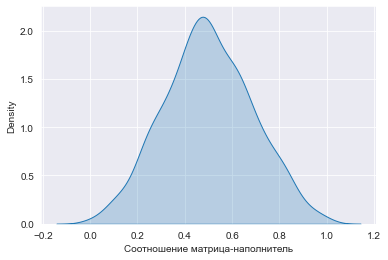

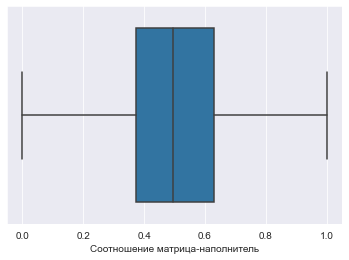

Минимальное значение:  0.0
Максимальное значение:  1.0000000000000002
Среднее значение:  0.49893345327838434
Медианное значение:  0.4945378642781892



Плотность, кг/м3


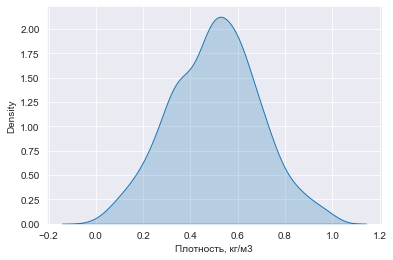

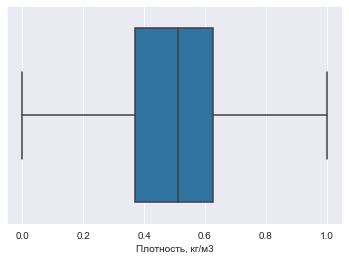

Минимальное значение:  0.0
Максимальное значение:  1.0
Среднее значение:  0.5026951430479757
Медианное значение:  0.5112291255242929



модуль упругости, ГПа


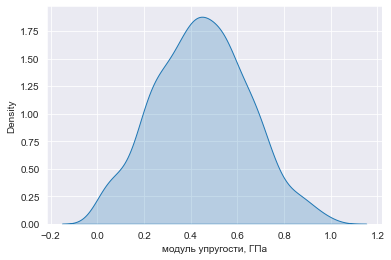

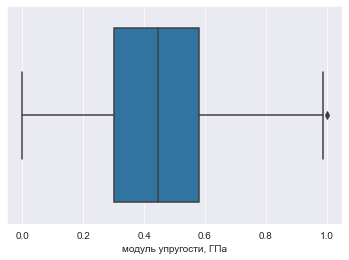

Минимальное значение:  0.0
Максимальное значение:  1.0
Среднее значение:  0.44676392877229976
Медианное значение:  0.44706096680674856



Количество отвердителя, м.%


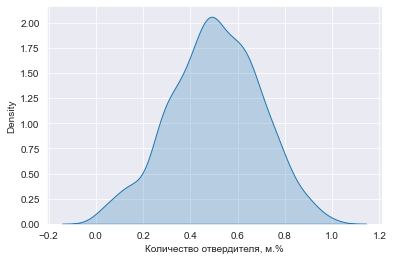

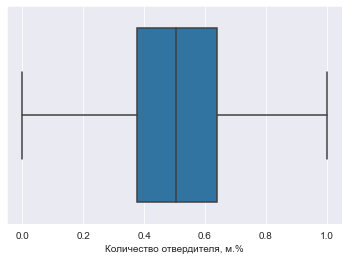

Минимальное значение:  0.0
Максимальное значение:  0.9999999999999999
Среднее значение:  0.5046643049104927
Медианное значение:  0.506040103921318



Содержание эпоксидных групп,%_2


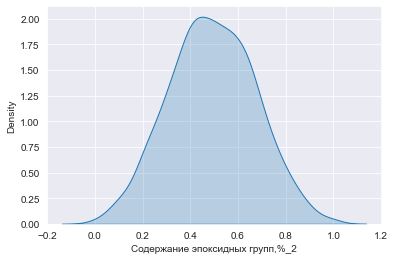

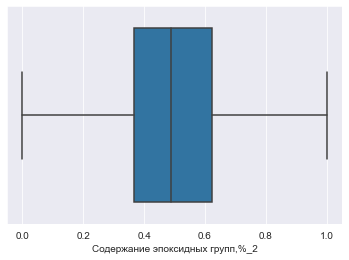

Минимальное значение:  0.0
Максимальное значение:  0.9999999999999998
Среднее значение:  0.4912163921173313
Медианное значение:  0.4893823495325058



Температура вспышки, С_2


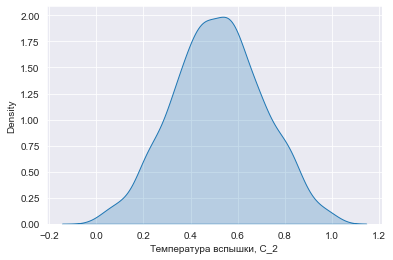

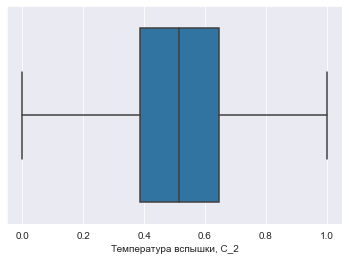

Минимальное значение:  0.0
Максимальное значение:  1.0
Среднее значение:  0.5160586620317391
Медианное значение:  0.5159798172304674



Поверхностная плотность, г/м2


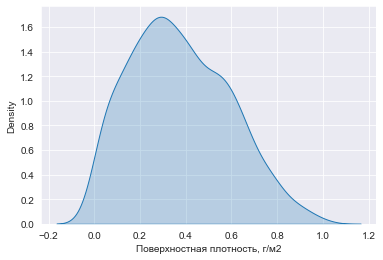

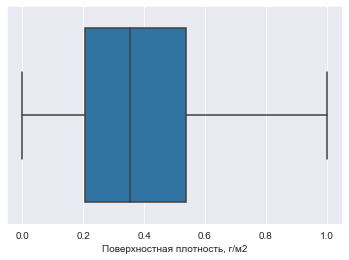

Минимальное значение:  0.0
Максимальное значение:  1.0000000000000002
Среднее значение:  0.3737325227232226
Медианное значение:  0.3541610160162339



Модуль упругости при растяжении, ГПа


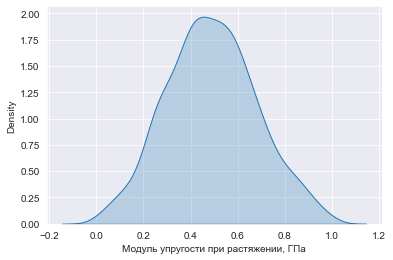

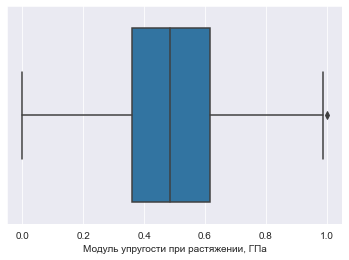

Минимальное значение:  0.0
Максимальное значение:  1.0
Среднее значение:  0.4886468284515052
Медианное значение:  0.48575363608244304



Прочность при растяжении, МПа


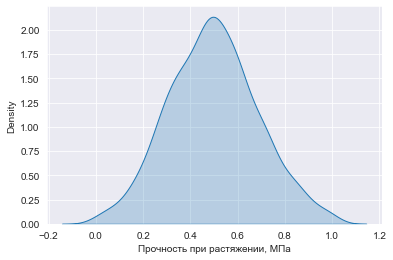

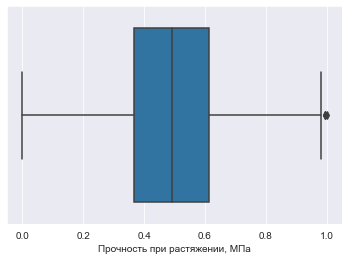

Минимальное значение:  0.0
Максимальное значение:  1.0
Среднее значение:  0.4957056458046606
Медианное значение:  0.4918245993405007



Потребление смолы, г/м2


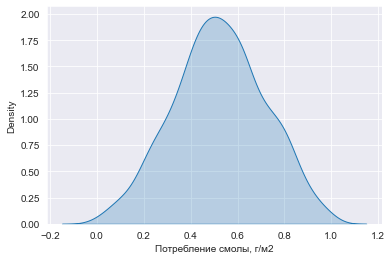

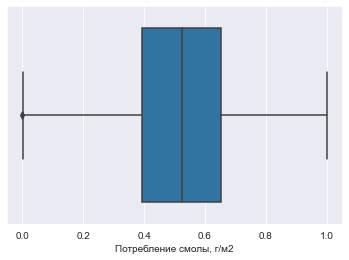

Минимальное значение:  0.0
Максимальное значение:  1.0
Среднее значение:  0.5211412421060743
Медианное значение:  0.5237662535716948



Угол нашивки, град


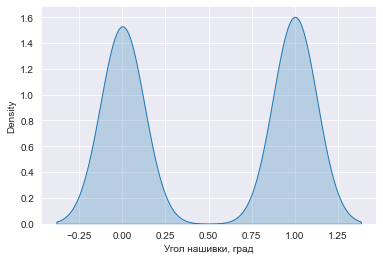

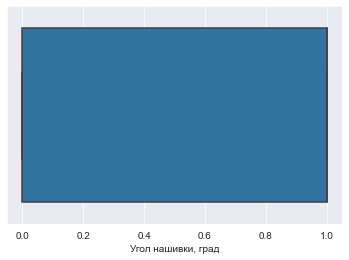

Минимальное значение:  0.0
Максимальное значение:  1.0
Среднее значение:  0.5117521367521367
Медианное значение:  1.0



Шаг нашивки


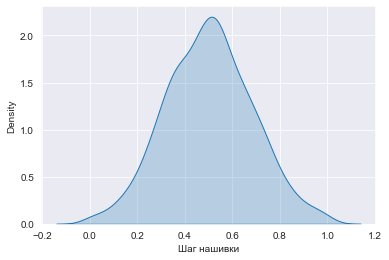

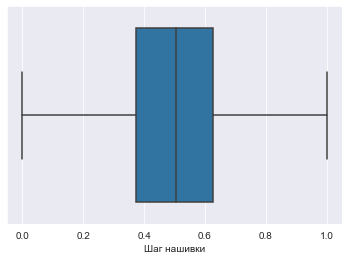

Минимальное значение:  0.0
Максимальное значение:  1.0
Среднее значение:  0.5022317234813997
Медианное значение:  0.504258210913958



Плотность нашивки


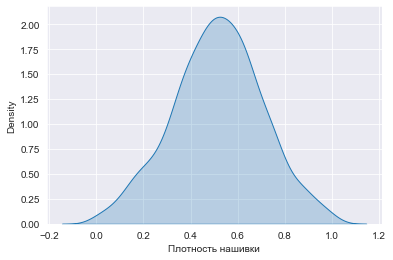

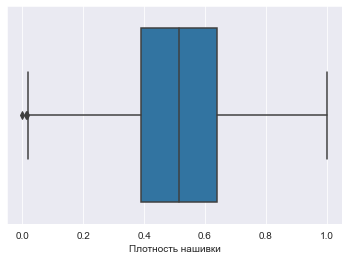

Минимальное значение:  0.0
Максимальное значение:  1.0
Среднее значение:  0.5137763775442847
Медианное значение:  0.5160292051115448





In [24]:
# Проводим анализ датасета после нормализации. 
for colname in colnames:
    print(colname)
# Рисуем гистограммы распределения каждой из переменной.
    sub_data_mm = minmaxresult[colname]
    sns.set_style("darkgrid")
    sns.kdeplot(data=sub_data_mm,shade=True, palette='colorblind')
    plt.show()
# Рисуем диаграммы ящика с усами
    sns.boxplot(x=sub_data_mm);
    plt.show()
# Для каждой колонки (признака) указываем минимальное, максимальное, среднее и медианное значение.
    print("Минимальное значение: ", end=" ")
    print(np.min(sub_data_mm))
    #Среднее значение
    print("Максимальное значение: ", end=" ")
    print(np.max(sub_data_mm))
    #Среднее значение
    print("Среднее значение: ", end=" ")
    print(np.mean(sub_data_mm))
    #Медианное значение
    print("Медианное значение: ", end=" ")
    print(np.median(sub_data_mm))
    print("\n\n")

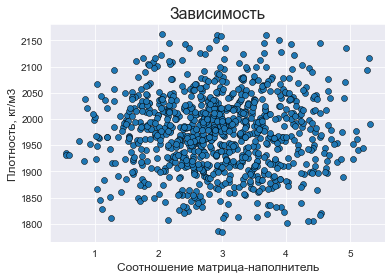

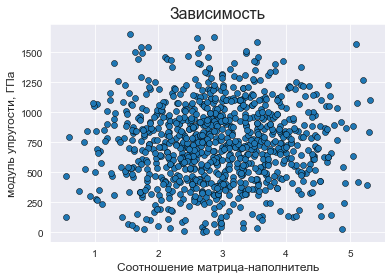

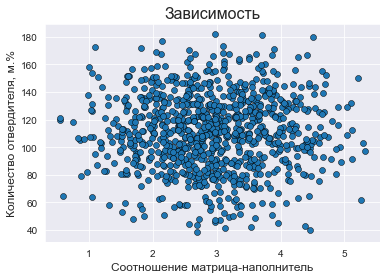

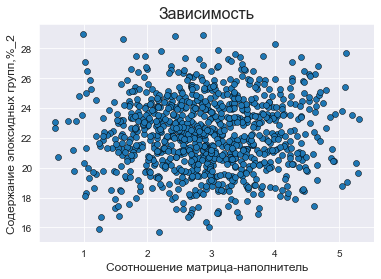

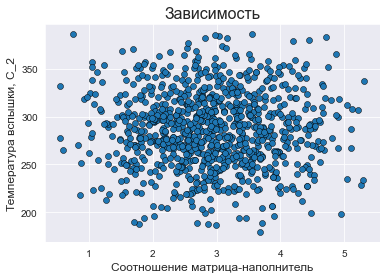

...

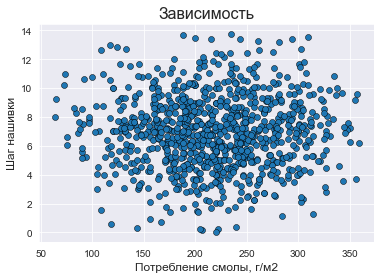

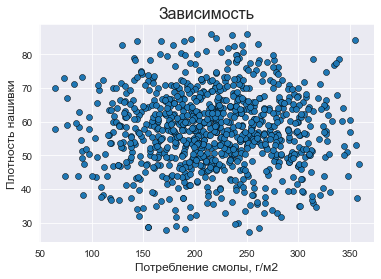

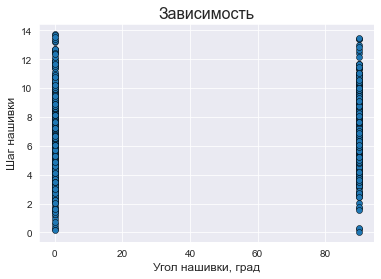

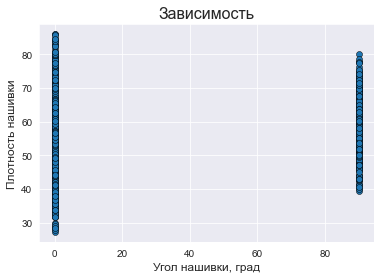

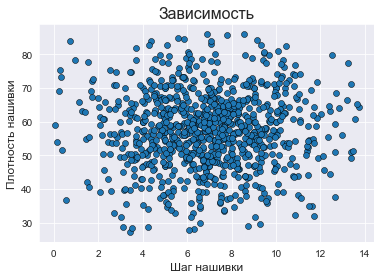

In [25]:
# Рисуем попарные графики рассеянивания точек.
number = 0
while number < len(colnames):
    number2 = number+1
    while number2 < len(colnames):
        sns.set_style('darkgrid')
        plt.title('Зависимость',size=16)
        plt.xlabel(colnames[number],size=12)
        plt.ylabel(colnames[number2],size=12)
        sns.scatterplot(x=colnames[number], y=colnames[number2], data=data_withoutdrop, edgecolor='black', palette='cubehelix')
        plt.show()
        number2 += 1
    number += 1

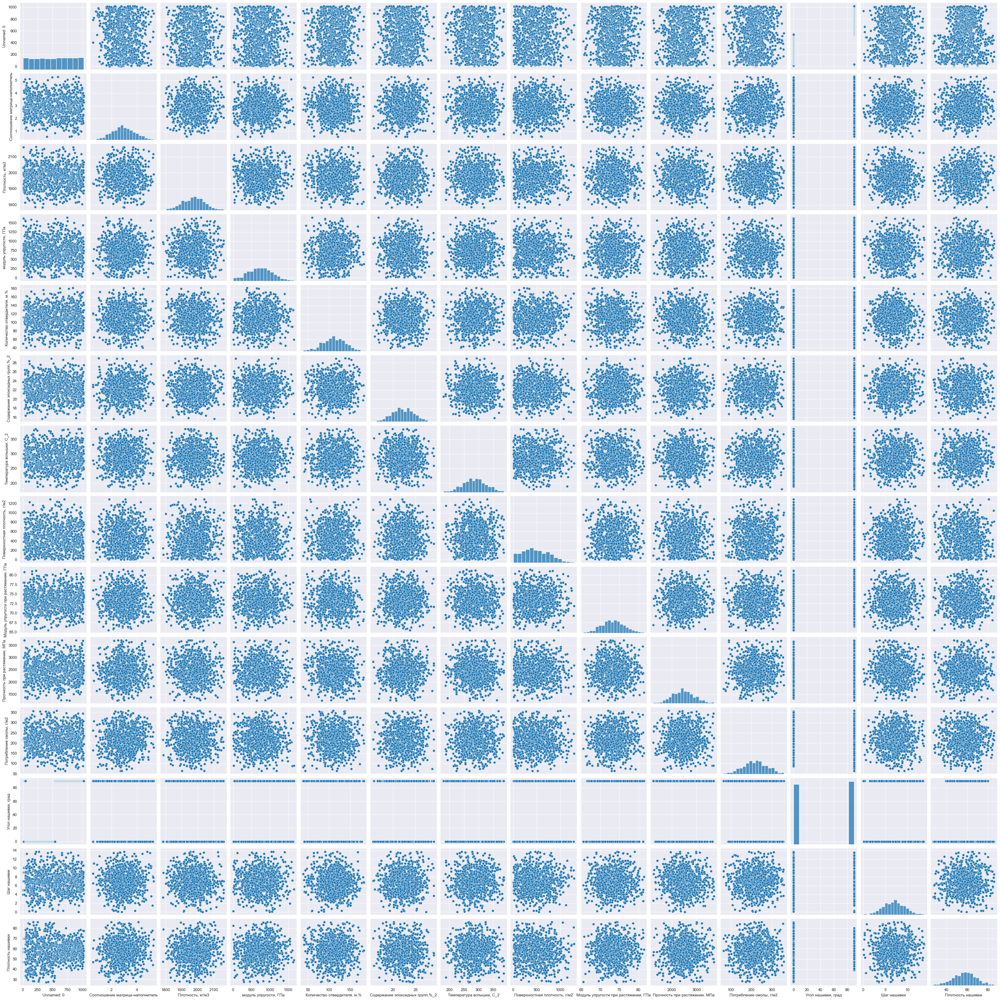

In [26]:
# На данной визуализации мы наблюдаем на одной картинке, как связаны между собой различные признаки до нормализации
sns.pairplot(data_withoutdrop)
plt.savefig('matrix2.png')

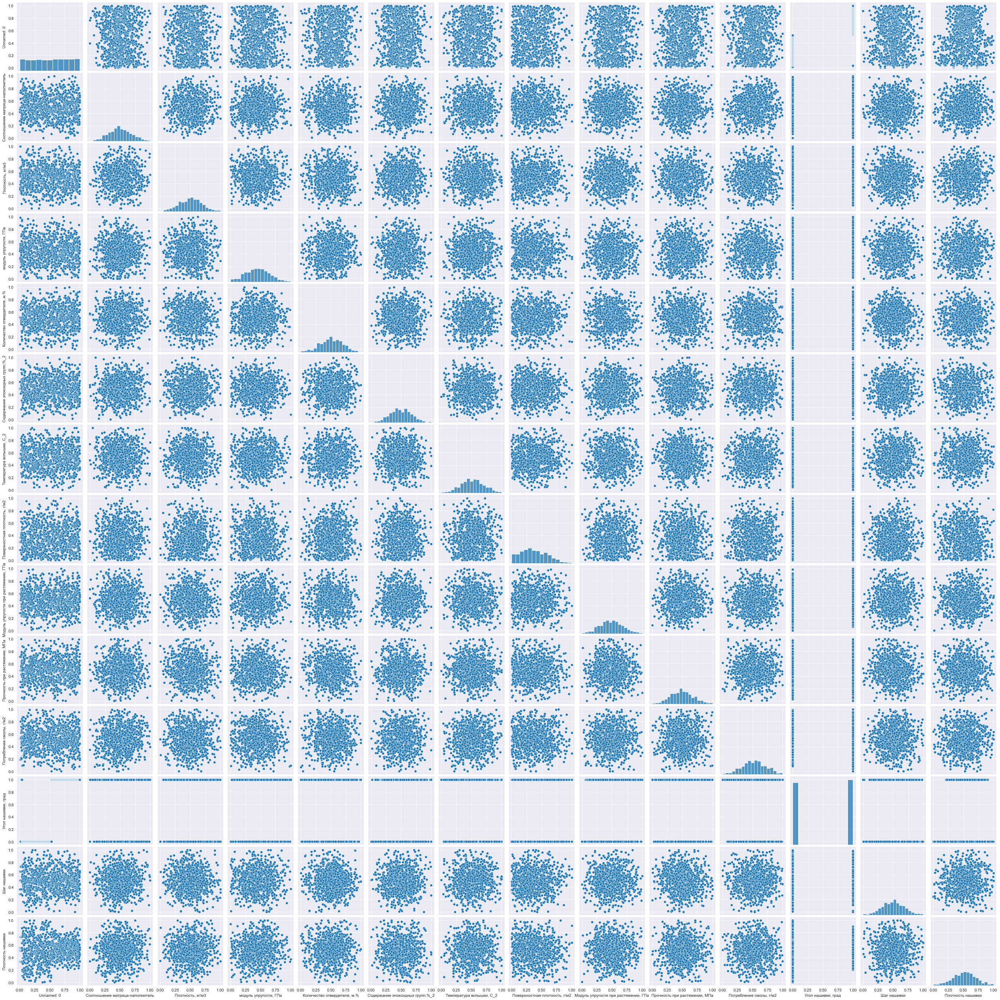

In [27]:
# На данной визуализации мы наблюдаем на одной картинке, как связаны между собой различные признаки после нормализации
sns.pairplot(minmaxresult)
plt.savefig('matrix2.png')

In [28]:
# Назначаем входные и выходные переменные для модели
colnames_in = ["Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%",
         "Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2"
               ,"Потребление смолы, г/м2",
        "Угол нашивки, град","Шаг нашивки","Плотность нашивки"]
colnames_out = ["Соотношение матрица-наполнитель",
         "Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа"]
# Входные
trn = minmaxresult[colnames_in]
# Выходные
trg = minmaxresult[colnames_out]

In [29]:
trn.info()
trg.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 936 entries, 0 to 935
Data columns (total 10 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Плотность, кг/м3                 936 non-null    float64
 1   модуль упругости, ГПа            936 non-null    float64
 2   Количество отвердителя, м.%      936 non-null    float64
 3   Содержание эпоксидных групп,%_2  936 non-null    float64
 4   Температура вспышки, С_2         936 non-null    float64
 5   Поверхностная плотность, г/м2    936 non-null    float64
 6   Потребление смолы, г/м2          936 non-null    float64
 7   Угол нашивки, град               936 non-null    float64
 8   Шаг нашивки                      936 non-null    float64
 9   Плотность нашивки                936 non-null    float64
dtypes: float64(10)
memory usage: 73.2 KB
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 936 entries, 0 to 935
Data columns (total 3 columns):
 #   

In [30]:
# Cписок моделей, которые будут использоваться для прогноза модуля упругости при растяжении и прочности при растяжении
models = [LinearRegression(), # Метод наименьших квадратов
#RandomForestRegressor(n_estimators=100, max_features ='sqrt'), # Случайный лес
KNeighborsRegressor(n_neighbors=10), # Метод ближайших соседей
SVR(kernel='linear'),# Метод опорных векторов с линейным ядром
GradientBoostingRegressor()# Метод градиентного бустинга
]

In [31]:
# 30% данных датасета оставляем на тестирование моделей, остальные будем задействовать для обучения моделей
Xtrn, Xtest, Ytrn, Ytest = train_test_split(trn, trg, test_size=0.3)

In [32]:
# Проверим различные модели 
TestModels = pd.DataFrame() #Создаем временные структуры
tmp = {}
for model in models:       # Каждой модели из вышеуказанного списка присваеваем имя
    m = str(model)
    tmp['Model'] = m[:m.index('(')]    
    for i in range(Ytrn.shape[1]):  # Для каждого столбца результирующего набора обучаем модель
            model.fit(Xtrn, Ytrn[colnames_out[i]]) 
            tmp['R2_Y%s'%str(i+1)] = r2_score(Ytest[colnames_out[i]], model.predict(Xtest))  # Вычисляем коэффициент детерминации
    TestModels = TestModels.append([tmp]) # Записываем данные и итоговый DataFrame
#делаем индекс по названию модели
TestModels.set_index('Model', inplace=True) # Создаем индекс по названию модели

C:\Temp/ipykernel_2184/1935102983.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  TestModels = TestModels.append([tmp]) # Записываем данные и итоговый DataFrame
C:\Temp/ipykernel_2184/1935102983.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  TestModels = TestModels.append([tmp]) # Записываем данные и итоговый DataFrame
C:\Temp/ipykernel_2184/1935102983.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  TestModels = TestModels.append([tmp]) # Записываем данные и итоговый DataFrame
C:\Temp/ipykernel_2184/1935102983.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  TestModels = TestModels.append([tmp]) # Записываем данные и

In [33]:
TestModels

,R2_Y1,R2_Y2,R2_Y3
Model,,,
LinearRegression,-0.002077,-0.022892,-0.030263
KNeighborsRegressor,-0.041201,-0.109885,-0.065555
SVR,0.001128,-0.006806,-0.051975
GradientBoostingRegressor,-0.033637,-0.100239,-0.176131


In [34]:
# Определим для моделей входные и выходные переменные
colnames_in_1 = ["Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Потребление смолы, г/м2","Угол нашивки, град","Шаг нашивки","Плотность нашивки"]
colnames_out_1 = ["Прочность при растяжении, МПа"]
#Входные
trn1 = minmaxresult[colnames_in_1]
#Выходные
trg1 = minmaxresult[colnames_out_1]

In [35]:
# 30% данных датасета оставляем на тестирование моделей, остальные будем задействовать для обучения моделей и перекрестных проверок
Xtrn11, Xtest11, Ytrn11, Ytest11 = train_test_split(trn1, trg1, test_size=0.3)

In [36]:
# Задаем сетку параметров, по которым будем оптимизировать первую модель
t_search11 = {'weights': ['uniform', 'distance'],
               'n_neighbors': list(np.linspace(5, 100, 10, dtype = int)),
               'algorithm': ['auto', 'ball_tree','kd_tree', 'brute'],
               'leaf_size': list(np.linspace(10, 100, 10, dtype = int))}

In [37]:
# Первая модель будет использовать метод ближайших соседей
clf11 = KNeighborsRegressor()

In [38]:
# Запустим обучение модели. В качестве оценки модели будем использовать коэффициент детерминации, количество блоков равно 10
# Кросс-валидация, метод, который показывает, что модель не переобучилась
model11 = GridSearchCV(estimator = clf11, scoring = 'r2', param_grid = t_search11, cv = 10, verbose= 1, n_jobs = -1)
model11.fit(Xtrn11,Ytrn11)

Fitting 10 folds for each of 800 candidates, totalling 8000 fits


GridSearchCV(cv=10, estimator=KNeighborsRegressor(), n_jobs=-1,
             param_grid={'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
                         'leaf_size': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100],
                         'n_neighbors': [5, 15, 26, 36, 47, 57, 68, 78, 89,
                                         100],
                         'weights': ['uniform', 'distance']},
             scoring='r2', verbose=1)

In [39]:
best_estimator = model11.best_estimator_
# Производим поиск гиперпараметров модели
print(best_estimator)
# Выводим лучший результат
print(model11.best_score_)

KNeighborsRegressor(algorithm='brute', leaf_size=10, n_neighbors=57,
                    weights='distance')
-0.025552492232478453


In [40]:
# Вводим функцию для вычисления точности модели. На входе модель, а также входные параметры и целевая переменная
def evaluate(model, test_features, test_labels):
# Делаем предсказание на основе входных параметров
    predictions = model.predict(test_features)
# Считаем абсолютные ошибки в предсказаниях (разность между предсказанным значением и целевым значением)
    errors = abs(predictions - test_labels)
    mape = 100 * np.mean(errors / test_labels)
# Определяем точность модели
    accuracy = 100 - mape
    print('Средняя абсолютная ошибка: {:0.4f}'.format(np.mean(errors.values)))
    return accuracy

In [41]:
# Подставляем оптимальные гиперпараметры в модель
model_base11 = KNeighborsRegressor(algorithm='brute', leaf_size=10, n_neighbors=68, weights='distance')
#Обучаем модель
model_base11.fit(Xtrn11,Ytrn11)
# Оцениваем точность на тренировочном наборе
base_accuracy = evaluate(model_base11, Xtrn11,Ytrn11)
# Оцениваем точность на тестовом наборе
base_accuracy = evaluate(model_base11, Xtest11,Ytest11)

Средняя абсолютная ошибка: 0.0000
Средняя абсолютная ошибка: 0.1404


C:\Users\User\AppData\Local\Programs\Python\Python39\lib\site-packages\numpy\core\fromnumeric.py:3472: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)
C:\Users\User\AppData\Local\Programs\Python\Python39\lib\site-packages\numpy\core\fromnumeric.py:3472: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


C:\Users\User\AppData\Local\Programs\Python\Python39\lib\site-packages\numpy\core\fromnumeric.py:84: FutureWarning: In a future version, DataFrame.min(axis=None) will return a scalar min over the entire DataFrame. To retain the old behavior, use 'frame.min(axis=0)' or just 'frame.min()'
  return reduction(axis=axis, out=out, **passkwargs)
C:\Users\User\AppData\Local\Programs\Python\Python39\lib\site-packages\numpy\core\fromnumeric.py:84: FutureWarning: In a future version, DataFrame.max(axis=None) will return a scalar max over the entire DataFrame. To retain the old behavior, use 'frame.max(axis=0)' or just 'frame.max()'
  return reduction(axis=axis, out=out, **passkwargs)


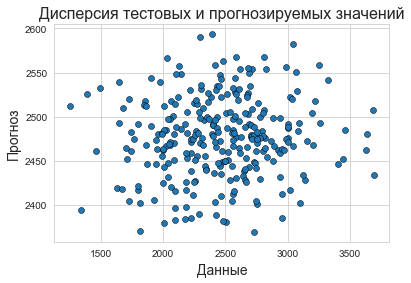

,Данные,Прогноз
0,2939.621240,2498.765251
1,2780.436589,2429.419597
2,2220.733566,2438.469730
3,2868.713028,2473.026955
4,3000.000000,2476.449688
...,...,...
276,2044.516968,2468.734463
277,2561.544646,2473.244727
278,2370.078697,2497.580078
279,2535.974160,2505.096345


In [42]:
# Спрогнозированные данные
predict11 = model_base11.predict(Xtest11)
predict11_values = np.ravel(predict11)
# Тестовые данные
tv11 = Ytest11.copy()
test11_values = np.ravel(tv11)
# Преобразуем нормализованные данные к исходным
col11 = ["Прочность при растяжении, МПа"]
# Определим параметры, которые использовались для нормализации
min_11 = np.min(data_withoutdrop[col11])
max_11 = np.max(data_withoutdrop[col11])
# Переведем данные из нормализованных в исходные
i = 0
while i < len(predict11_values):
    predict11_values[i] = predict11_values[i]*(max_11 - min_11) + min_11
    test11_values[i] = test11_values[i]*(max_11 - min_11) + min_11
    i += 1
# Создадим датасет с тестовыми данными и прогнозируемыми значениями
feature_results = pd.DataFrame({'Данные': test11_values,'Прогноз': predict11_values})
# Построим  график рассеяния. В случае идеального прогноза график был бы близок к прямой
sns.set_style('whitegrid')
plt.title('Дисперсия тестовых и прогнозируемых значений',size=16)
plt.xlabel('Данные',size=14)
plt.ylabel('Прогноз',size=14)
sns.scatterplot(x='Данные', y='Прогноз', data=feature_results, edgecolor='black', palette='cubehelix')
plt.show()
feature_results

In [43]:
# Задаем сетку параметров, по которым будем оптимизировать вторую модель
t_search12 = {'n_estimators': list(np.linspace(100, 500, 5, dtype = int)),
             'loss': ['ls', 'lad', 'huber'],
             'max_depth': [2, 3, 5, 10, 15]}
#В качестве второй модели будем использовать метод градиентного бустинга
clf12 = GradientBoostingRegressor()

In [44]:
# 30% данных датасета оставляем на тестирование моделей, остальные будем задействовать для обучения моделей и перекрестных проверок
Xtrn12, Xtest12, Ytrn12, Ytest12 = train_test_split(trn1, trg1, test_size=0.3)

In [45]:
# Запустим обучение модели. В качестве оценки модели будем использовать коэффициент детерминации
# Количество блоков для перекрестной проверки 10
model12 = GridSearchCV(estimator = clf12, scoring = 'r2', param_grid = t_search12, cv = 10, verbose= 1, n_jobs = -1)
model12.fit(Xtrn12,np.ravel(Ytrn12)) 

Fitting 10 folds for each of 75 candidates, totalling 750 fits


C:\Users\User\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\ensemble\_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(


GridSearchCV(cv=10, estimator=GradientBoostingRegressor(), n_jobs=-1,
             param_grid={'loss': ['ls', 'lad', 'huber'],
                         'max_depth': [2, 3, 5, 10, 15],
                         'n_estimators': [100, 200, 300, 400, 500]},
             scoring='r2', verbose=1)

In [46]:
best_estimator = model12.best_estimator_
# Выводим гиперпараметры для оптимальной модели
print(best_estimator)
# Выводим лучший результат
print(model12.best_score_)

GradientBoostingRegressor(loss='lad', max_depth=2)
-0.04075004349713753


In [47]:
# Определяем функцию для вычисления точности модели
def evaluate_2(model, test_features, test_labels):
# Делаем предсказание на основе входных параметров
    predictions = model.predict(test_features)
# Преобразуем к виду [[],[],...] из одномерного массива
    predict = np.reshape(predictions,(predictions.size, 1))
# Считаем абсолютные ошибки в предсказаниях (разность между предсказанным значением и целевым значением)
    errors = abs(predict - test_labels)
    mape = 100 * np.mean(errors / test_labels)
# Определяем точность модели
    accuracy = 100 - mape
    print('Средняя абсолютная ошибка: {:0.4f}'.format(np.mean(errors.values)))
    return accuracy

In [48]:
# Подставляем оптимальные гиперпараметры в модель
model_base12 = GradientBoostingRegressor(loss='lad', max_depth=2)
# Обучаем модель
model_base12.fit(Xtrn12,np.ravel(Ytrn12))

C:\Users\User\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\ensemble\_gb.py:293: FutureWarning: The loss 'lad' was deprecated in v1.0 and will be removed in version 1.2. Use 'absolute_error' which is equivalent.
  warnings.warn(


GradientBoostingRegressor(loss='lad', max_depth=2)

In [49]:
# Оцениваем точность на тренировочном наборе
base_accuracy = evaluate_2(model_base12, Xtrn12, Ytrn12)
# Оцениваем точность на тестовом наборе
base_accuracy = evaluate_2(model_base12, Xtest12, Ytest12)

Средняя абсолютная ошибка: 0.1263
Средняя абсолютная ошибка: 0.1523


C:\Users\User\AppData\Local\Programs\Python\Python39\lib\site-packages\numpy\core\fromnumeric.py:3472: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)
C:\Users\User\AppData\Local\Programs\Python\Python39\lib\site-packages\numpy\core\fromnumeric.py:3472: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


In [50]:
# Оцениваем важность параметров в модели
importances = model_base12.feature_importances_
# формируем названия колонок параметров
feature_list = list(Xtrn12.columns)
# Формируем таблицу для визуального представления
feature_results = pd.DataFrame({'Параметр': feature_list,'Важность параметра': importances})
# Сортируем по уменьшению важности параметров
feature_results = feature_results.sort_values('Важность параметра',ascending = False).reset_index(drop=True)

In [51]:
feature_results

,Параметр,Важность параметра
0,"Количество отвердителя, м.%",0.182832
1,"Потребление смолы, г/м2",0.161967
2,"модуль упругости, ГПа",0.107925
3,Плотность нашивки,0.104898
4,"Поверхностная плотность, г/м2",0.095160
5,"Плотность, кг/м3",0.091325
6,"Температура вспышки, С_2",0.087781
7,Шаг нашивки,0.085842
8,"Содержание эпоксидных групп,%_2",0.082269
9,"Угол нашивки, град",0.000000


C:\Users\User\AppData\Local\Programs\Python\Python39\lib\site-packages\numpy\core\fromnumeric.py:84: FutureWarning: In a future version, DataFrame.min(axis=None) will return a scalar min over the entire DataFrame. To retain the old behavior, use 'frame.min(axis=0)' or just 'frame.min()'
  return reduction(axis=axis, out=out, **passkwargs)
C:\Users\User\AppData\Local\Programs\Python\Python39\lib\site-packages\numpy\core\fromnumeric.py:84: FutureWarning: In a future version, DataFrame.max(axis=None) will return a scalar max over the entire DataFrame. To retain the old behavior, use 'frame.max(axis=0)' or just 'frame.max()'
  return reduction(axis=axis, out=out, **passkwargs)


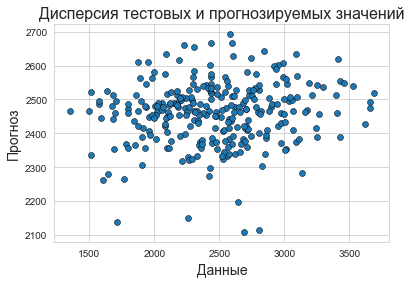

,Данные,Прогноз
0,3267.969502,2458.186851
1,3033.723583,2494.230689
2,2840.934853,2642.971993
3,1889.599157,2564.457118
4,2096.056525,2355.566675
...,...,...
276,2574.603443,2414.381309
277,2195.011890,2503.464582
278,2312.890280,2462.808522
279,2597.677710,2665.432701


In [52]:
# Спрогнозированные данные
predict12 = model_base12.predict(Xtest12)
predict12_values = np.ravel(predict12)
# Тестовые данные
tv12 = Ytest12.copy()
test12_values = np.ravel(tv12)
# Преобразуем нормализованные данные к исходным
col12 = ["Прочность при растяжении, МПа"]
# Определим параметры, которые использовались для нормализации
min_12 = np.min(data_withoutdrop[col12])
max_12 = np.max(data_withoutdrop[col12])
# Переведем данные из нормализованных в исходные
i = 0
while i < len(predict12_values):
    predict12_values[i] = predict12_values[i]*(max_12 - min_12) + min_12
    test12_values[i] = test12_values[i]*(max_12 - min_12) + min_12
    i += 1
# Создадим датасет с тестовыми данными и прогнозируемыми значениями
feature_results = pd.DataFrame({'Данные': test12_values,'Прогноз': predict12_values})
# Построим  график рассеяния. В случае идеального прогноза график был бы близок к прямой
sns.set_style('whitegrid')
plt.title('Дисперсия тестовых и прогнозируемых значений',size=16)
plt.xlabel('Данные',size=14)
plt.ylabel('Прогноз',size=14)
sns.scatterplot(x='Данные', y='Прогноз', data=feature_results, edgecolor='black', palette='cubehelix')
plt.show()
feature_results

In [53]:
# Отделяем выходные переменные и входные
# Проверяем модели для прогнозирования модуля упругости при растяжении, ГПа
colnames_out_2 = ["Модуль упругости при растяжении, ГПа"]
colnames_in_2 = ["Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Потребление смолы, г/м2","Угол нашивки, град","Шаг нашивки","Плотность нашивки"]
# Выходные
trg2 = minmaxresult[colnames_out_2]
# Входные
trn2 = minmaxresult[colnames_in_2]

In [54]:
# 30% данных датасета оставляем на тестирование моделей, остальные будем задействовать для обучения моделей и перекрестных проверок
Xtrn21, Xtest21, Ytrn21, Ytest21 = train_test_split(trn2, trg2, test_size=0.3)

In [55]:
# Зададим сетку параметров, по которым будем оптимизировать модель
t_search21 = {'fit_intercept': [True, False],
               'positive': [True, False]}
# В качестве модели будем использовать метод наименьших квадратов
clf21 = LinearRegression()

In [56]:
model21 = GridSearchCV(estimator = clf21, scoring = 'r2', param_grid = t_search21, cv = 10, verbose= 1, n_jobs = -1)
model21.fit(Xtrn21,Ytrn21)

Fitting 10 folds for each of 4 candidates, totalling 40 fits


GridSearchCV(cv=10, estimator=LinearRegression(), n_jobs=-1,
             param_grid={'fit_intercept': [True, False],
                         'positive': [True, False]},
             scoring='r2', verbose=1)

In [57]:
best_estimator = model21.best_estimator_
print(best_estimator)
print(model12.best_score_)

LinearRegression(positive=True)
-0.04075004349713753


In [58]:
# Подставляем оптимальные гиперпараметры в модель и обучаем
model_base21 = LinearRegression(positive=True)
model_base21.fit(Xtrn21,Ytrn21)

LinearRegression(positive=True)

In [59]:
# Оцениваем точность на тренировочном наборе и тестовом наборах
base_accuracy = evaluate(model_base21, Xtrn21, Ytrn21)
base_accuracy = evaluate(model_base21, Xtest21, Ytest21)

Средняя абсолютная ошибка: 0.1575
Средняя абсолютная ошибка: 0.1444


C:\Users\User\AppData\Local\Programs\Python\Python39\lib\site-packages\numpy\core\fromnumeric.py:3472: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)
C:\Users\User\AppData\Local\Programs\Python\Python39\lib\site-packages\numpy\core\fromnumeric.py:3472: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


In [60]:
# Оцениваем важность папаметров в модели
importances = np.ravel(model_base21.coef_)
feature_list = list(Xtrn21.columns)
feature_results = pd.DataFrame({'Параметр': feature_list,'Важность параметра': importances})
# Сортируем по уменьшению важности
feature_results = feature_results.sort_values('Важность параметра',ascending = False).reset_index(drop=True)

In [61]:
feature_results

,Параметр,Важность параметра
0,"Содержание эпоксидных групп,%_2",0.061918
1,"Потребление смолы, г/м2",0.047362
2,Плотность нашивки,0.033682
3,"Поверхностная плотность, г/м2",0.020683
4,"модуль упругости, ГПа",0.010891
5,"Угол нашивки, град",0.009093
6,"Плотность, кг/м3",0.000000
7,"Количество отвердителя, м.%",0.000000
8,"Температура вспышки, С_2",0.000000
9,Шаг нашивки,0.000000


C:\Users\User\AppData\Local\Programs\Python\Python39\lib\site-packages\numpy\core\fromnumeric.py:84: FutureWarning: In a future version, DataFrame.min(axis=None) will return a scalar min over the entire DataFrame. To retain the old behavior, use 'frame.min(axis=0)' or just 'frame.min()'
  return reduction(axis=axis, out=out, **passkwargs)
C:\Users\User\AppData\Local\Programs\Python\Python39\lib\site-packages\numpy\core\fromnumeric.py:84: FutureWarning: In a future version, DataFrame.max(axis=None) will return a scalar max over the entire DataFrame. To retain the old behavior, use 'frame.max(axis=0)' or just 'frame.max()'
  return reduction(axis=axis, out=out, **passkwargs)


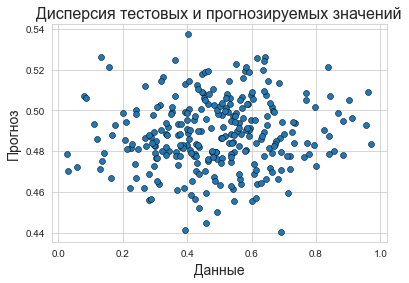

,Данные,Прогноз
0,0.529052,0.483987
1,0.534113,0.502937
2,0.364584,0.479383
3,0.712107,0.459301
4,0.302710,0.476510
...,...,...
276,0.468694,0.507929
277,0.538508,0.484031
278,0.369005,0.460888
279,0.601183,0.508931


In [62]:
predict21 = model_base21.predict(Xtest21)
predict21_values = np.ravel(predict21)
tv21 = Ytest21.copy()
test21_values = np.ravel(tv21)
col21 = ["Модуль упругости при растяжении, ГПа"]
min_21 = np.min(data_withoutdrop[col21])
max_21 = np.max(data_withoutdrop[col21])
while i < len(predict21_values):
    predict21_values[i] = predict21_values[i]*(max_21 - min_21) + min_21
    test21_values[i] = test21_values[i]*(max_21 - min_21) + min_21
    i += 1
feature_results = pd.DataFrame({'Данные': test21_values,'Прогноз': predict21_values})
sns.set_style('whitegrid')
plt.title('Дисперсия тестовых и прогнозируемых значений',size=16)
plt.xlabel('Данные',size=14)
plt.ylabel('Прогноз',size=14)
sns.scatterplot(x='Данные', y='Прогноз', data=feature_results, edgecolor='black', palette='cubehelix')
plt.show()
feature_results

In [63]:
# Зададим сетку параметров, по которым будем оптимизировать модель
t_search22 = {'kernel': ['linear', 'poly', 'rbf'],
               'degree': list(np.linspace(3, 5, 3, dtype = int))}
# В качестве модели будем использовать метод опорных векторов
clf22 = SVR()

In [64]:
# 30% данных датасета оставляем на тестирование моделей, остальные будем задействовать для обучения моделей и перекрестных проверок
Xtrn22, Xtest22, Ytrn22, Ytest22 = train_test_split(trn2, trg2, test_size=0.3)

In [65]:
model22 = GridSearchCV(estimator = clf22, scoring = 'r2', param_grid = t_search22, cv = 10, verbose= 1, n_jobs = -1)
model22.fit(Xtrn22,np.ravel(Ytrn22))

Fitting 10 folds for each of 9 candidates, totalling 90 fits


GridSearchCV(cv=10, estimator=SVR(), n_jobs=-1,
             param_grid={'degree': [3, 4, 5],
                         'kernel': ['linear', 'poly', 'rbf']},
             scoring='r2', verbose=1)

In [66]:
best_estimator = model22.best_estimator_
# Выводим гиперпараметры для оптимальной модели
print(best_estimator)
# Выводим точность 
print(model22.best_score_)

SVR(kernel='linear')
-0.0363373445138919


In [67]:
# Подставляем оптимальные гиперпараметры в модель
model_base22 = SVR(kernel='linear')
# Обучаем модель
model_base22.fit(Xtrn22,np.ravel(Ytrn22))

SVR(kernel='linear')

In [68]:
# Оцениваем точность на тренировочном наборе
base_accuracy = evaluate_2(model_base22, Xtrn22, Ytrn22)
# Оцениваем точность на тестовом наборе
base_accuracy = evaluate_2(model_base22, Xtest22, Ytest22)

Средняя абсолютная ошибка: 0.1535
Средняя абсолютная ошибка: 0.1547


C:\Users\User\AppData\Local\Programs\Python\Python39\lib\site-packages\numpy\core\fromnumeric.py:3472: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)
C:\Users\User\AppData\Local\Programs\Python\Python39\lib\site-packages\numpy\core\fromnumeric.py:3472: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


C:\Users\User\AppData\Local\Programs\Python\Python39\lib\site-packages\numpy\core\fromnumeric.py:84: FutureWarning: In a future version, DataFrame.min(axis=None) will return a scalar min over the entire DataFrame. To retain the old behavior, use 'frame.min(axis=0)' or just 'frame.min()'
  return reduction(axis=axis, out=out, **passkwargs)
C:\Users\User\AppData\Local\Programs\Python\Python39\lib\site-packages\numpy\core\fromnumeric.py:84: FutureWarning: In a future version, DataFrame.max(axis=None) will return a scalar max over the entire DataFrame. To retain the old behavior, use 'frame.max(axis=0)' or just 'frame.max()'
  return reduction(axis=axis, out=out, **passkwargs)


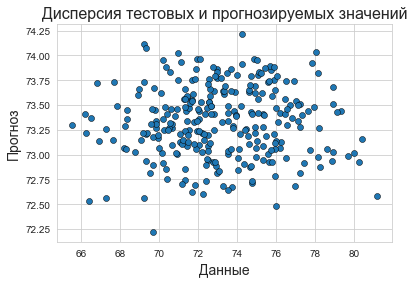

,Данные,Прогноз
0,72.137410,73.532800
1,75.891243,73.208804
2,70.191235,72.917271
3,70.425336,72.750455
4,75.882143,73.755123
...,...,...
276,69.341133,74.070329
277,71.998691,73.460944
278,71.470099,73.125005
279,75.963543,72.785505


In [69]:
# Спрогнозированные данные
predict22 = model_base22.predict(Xtest22)
predict22_values = np.ravel(predict22)
# Тестовые данные
tv22 = Ytest22.copy()
test22_values = np.ravel(tv22)
# Преобразуем нормализованные данные к исходным
col22 = ["Модуль упругости при растяжении, ГПа"]
# Определим параметры, которые использовались для нормализации
min_22 = np.min(data_withoutdrop[col22])
max_22 = np.max(data_withoutdrop[col22])
# Переведем данные из нормализованных в исходные
i = 0
while i < len(predict22_values):
    predict22_values[i] = predict22_values[i]*(max_22 - min_22) + min_22
    test22_values[i] = test22_values[i]*(max_22 - min_22) + min_22
    i += 1
# Создадим датасет с тестовыми данными и прогнозными значениями
feature_results = pd.DataFrame({'Данные': test22_values,'Прогноз': predict22_values})
# Выведем график рассеяния. 
sns.set_style('whitegrid')
plt.title('Дисперсия тестовых и прогнозируемых значений',size=16)
plt.xlabel('Данные',size=14)
plt.ylabel('Прогноз',size=14)
sns.scatterplot(x='Данные', y='Прогноз', data=feature_results, edgecolor='black', palette='cubehelix')
plt.show()
feature_results